In [60]:
!pip install xgboost

   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.5/124.9 MB 882.6 kB/s eta 0:02:21
   ---------------------------------------- 0.8/124.9 MB 859.5 kB/s eta 0:02:25
   ---------------------------------------- 1.0/124.9 MB 867.1 kB/s eta 0:02:23
   ---------------------------------------- 1.0/124.9 MB 867.1 kB/s eta 0:02:23
   ---------------------------------------- 1.3/124.9 MB 860.2 kB/s eta 0:02:24
   ---------------------------------------- 1.3/124.9 MB 860.2 kB/s eta 0:02:24
    --------------------------------------- 1.6/124.9 MB 838.6 kB/s eta 0:02:28
    --------------------------------------- 1.8/124.9 MB 845.6 kB/s eta 0:02:26
    --------------------------------------- 1.8/124.9 MB 845.6 kB/s eta 0:02:26
    --------------------------------------- 2.1/124.9 MB 838.7 kB/s

In [25]:
!pip install imbalanced-learn

# import libraries


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay

In [2]:
df_train = pd.read_csv("churn-80.csv")
df_test = pd.read_csv("churn-20.csv")

In [3]:
df_train.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [4]:
df_train.shape

(2666, 20)

# PreProcessing

In [5]:
df_train.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [6]:
df_train.nunique()

State                       51
Account length             205
Area code                    3
International plan           2
Voice mail plan              2
Number vmail messages       42
Total day minutes         1489
Total day calls            115
Total day charge          1489
Total eve minutes         1442
Total eve calls            120
Total eve charge          1301
Total night minutes       1444
Total night calls          118
Total night charge         885
Total intl minutes         158
Total intl calls            21
Total intl charge          158
Customer service calls      10
Churn                        2
dtype: int64

In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [8]:
df_train["Churn"] = df_train["Churn"].astype("int64")

In [9]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [10]:
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
Account length,2666.0,100.620405,39.563974,1.00,73.0000,100.00,127.000,243.00
Area code,2666.0,437.438860,42.521018,408.00,408.0000,415.00,510.000,510.00
Number vmail messages,2666.0,8.021755,13.612277,0.00,0.0000,0.00,19.000,50.00
Total day minutes,2666.0,179.481620,54.210350,0.00,143.4000,179.95,215.900,350.80
Total day calls,2666.0,100.310203,19.988162,0.00,87.0000,101.00,114.000,160.00
Total day charge,2666.0,30.512404,9.215733,0.00,24.3800,30.59,36.700,59.64
Total eve minutes,2666.0,200.386159,50.951515,0.00,165.3000,200.90,235.100,363.70
Total eve calls,2666.0,100.023631,20.161445,0.00,87.0000,100.00,114.000,170.00
Total eve charge,2666.0,17.033072,4.330864,0.00,14.0500,17.08,19.980,30.91
Total night minutes,2666.0,201.168942,50.780323,43.70,166.9250,201.15,236.475,395.00


In [11]:
df_train.describe(include=["object"]).T

,count,unique,top,freq
State,2666,51,WV,88
International plan,2666,2,No,2396
Voice mail plan,2666,2,No,1933


In [12]:
df_train["Churn"].value_counts()

Churn
0    2278
1     388
Name: count, dtype: int64

In [13]:
df_train["Churn"].value_counts(normalize=True)

Churn
0    0.854464
1    0.145536
Name: proportion, dtype: float64

In [14]:
df_train.drop(columns=['State', 'Area code'], axis=1, inplace=True)

Text(0.5, 1.0, 'Pie chart of churn labels')

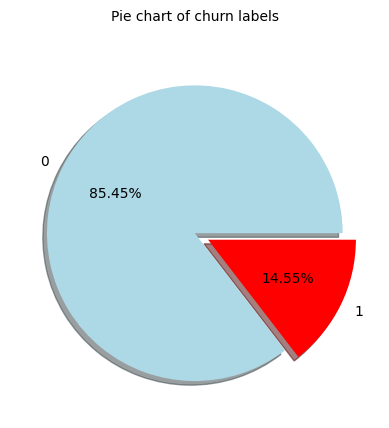

In [15]:
plt.pie(
    df_train['Churn'].value_counts(),
    autopct="%.2f%%",
    labels=(df_train['Churn'].value_counts()).index,
    colors=["lightblue", "red"],
    explode=[0, 0.1],
    shadow=True,
)
plt.title("Pie chart of churn labels", pad=20, fontsize=10, fontweight=20)

In [16]:
yes_no_mapping = {"Yes": 1, "No": 0}
df_train["International plan"] = df_train["International plan"].map(yes_no_mapping)
df_train["Voice mail plan"] = df_train["Voice mail plan"].map(yes_no_mapping)

In [17]:
df_train.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


# Visualization

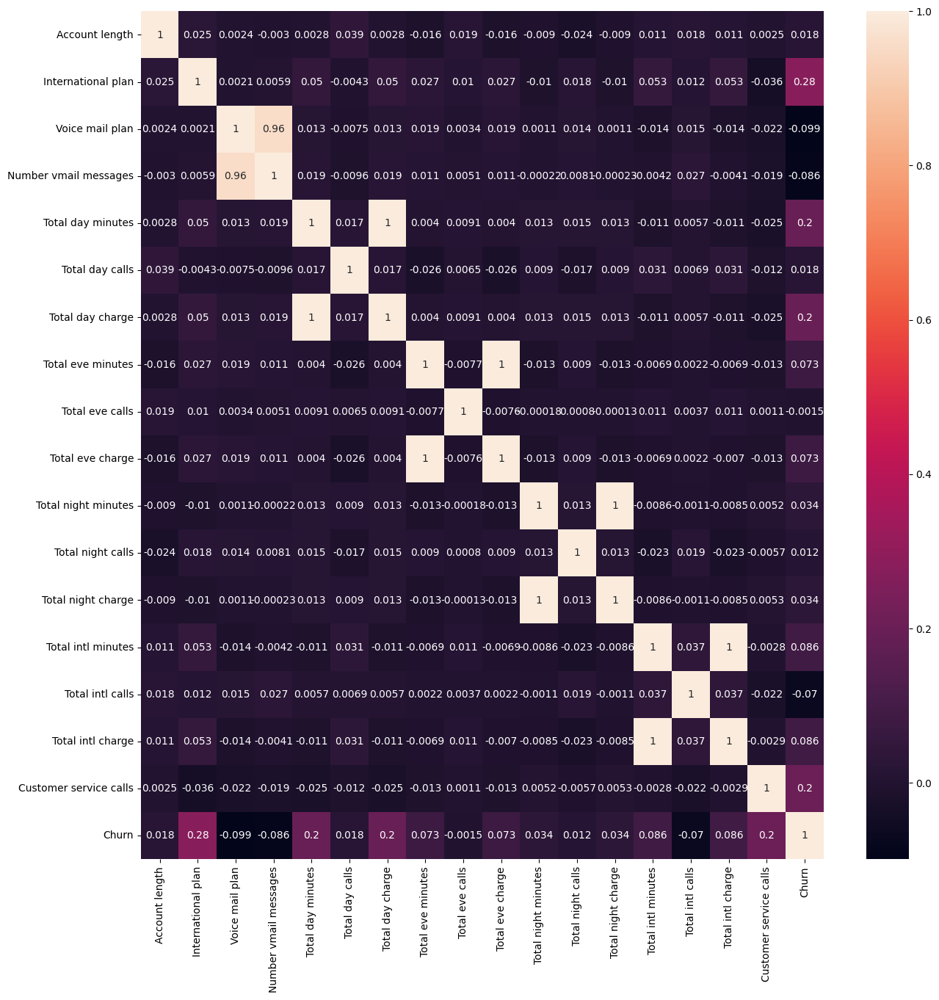

In [46]:
# a heatmap for correlation of the columns
plt.figure(figsize=(15,15))
sns.heatmap(df_train.corr(),annot=True);

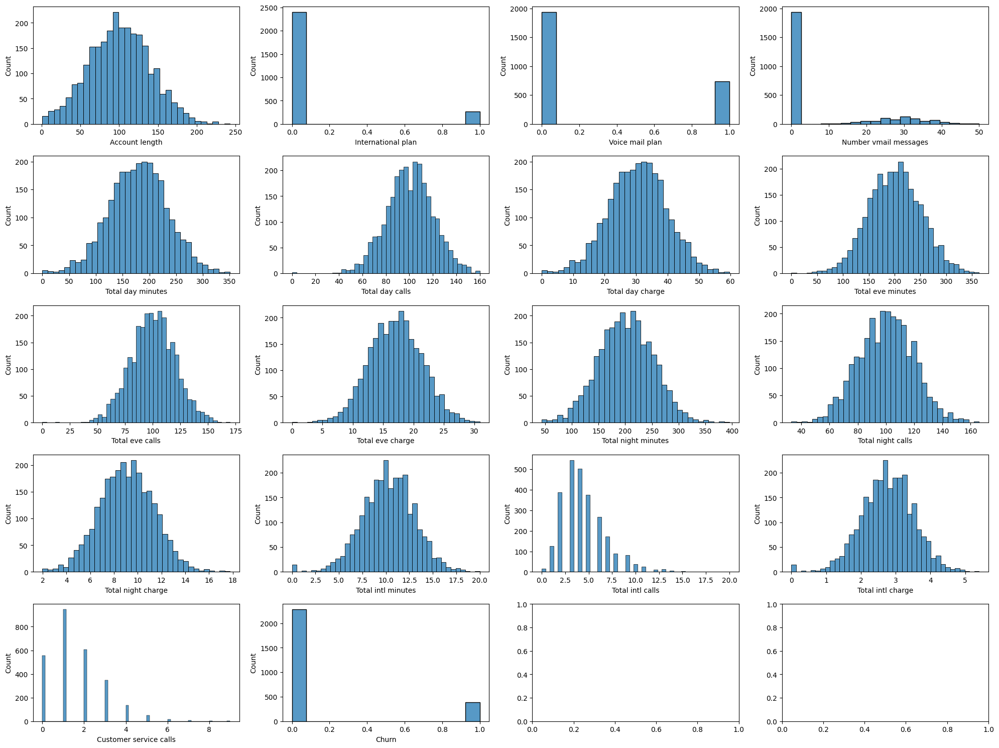

In [50]:
num_rows = (len(df_train.columns) + 2) // 4  # Calculate the number of rows needed
fig, axes = plt.subplots(nrows=num_rows, ncols=4, figsize=(20,15))

# histplot for each column in the data
for i, col in enumerate(df_train.columns):
    sns.histplot(data=df_train, x=col, ax=axes[i // 4, i % 4])
plt.tight_layout()
plt.show()

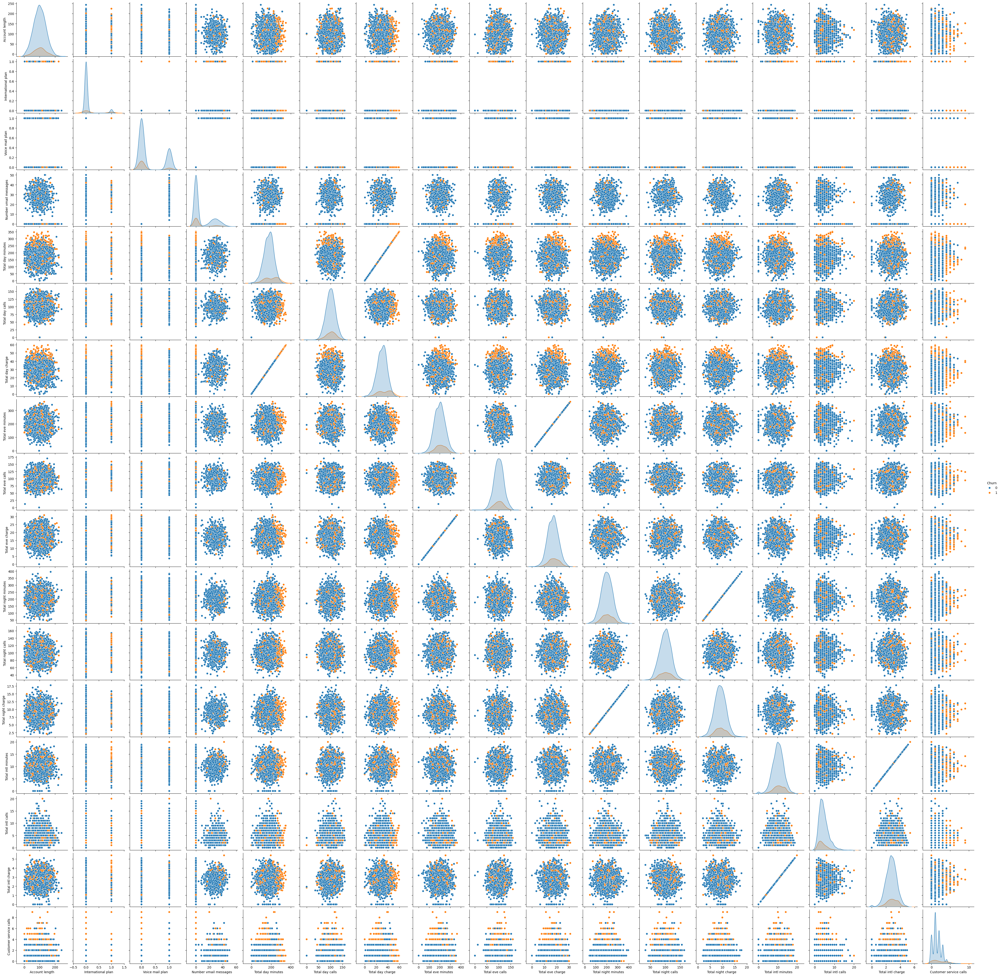

In [53]:
sns.pairplot(df_train,hue="Churn");

In [18]:
df_test.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,False
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,False


In [19]:
df_test.shape

(667, 20)

In [20]:
df_test["Churn"] = df_test["Churn"].astype("int64")
df_test.drop(columns=['State', 'Area code'], axis=1, inplace=True)
yes_no_mapping = {"Yes": 1, "No": 0}
df_test["International plan"] = df_test["International plan"].map(yes_no_mapping)
df_test["Voice mail plan"] = df_test["Voice mail plan"].map(yes_no_mapping)

In [21]:
df_test.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,117,0,0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,0
1,65,0,0,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,1
2,161,0,0,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,1
3,111,0,0,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,0
4,49,0,0,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,0


# Modeling

In [30]:
X = df_train.drop('Churn', axis=1)
y = df_train['Churn']
X.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3


In [31]:
# One Hot Encoding for categorical/boolean features
X_encoded = pd.get_dummies(X, columns=[f for f in X.columns if X.dtypes[f] == 'object'])

In [32]:
from imblearn.combine import SMOTEENN

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Combine oversampling and undersampling using SMOTEENN
smote_enn = SMOTEENN(random_state=42)
X_resampled, y_resampled = smote_enn.fit_resample(X_train, y_train)

print("Class distribution after resampling:")
print(pd.Series(y_resampled).value_counts())

Class distribution after resampling:
Churn
1    1709
0    1018
Name: count, dtype: int64


In [33]:
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y,test_size=0.2,random_state=13,stratify=y)

X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.7, random_state=13,stratify=y_test)
X_train.shape, X_val.shape, X_test.shape

((2132, 17), (160, 17), (374, 17))

In [43]:
model = xgb.XGBClassifier(objective="binary:logistic", missing=-1, seed=13)
model.fit(X_train, y_train,eval_set=[(X_val, y_val)],verbose=True)

[0]	validation_0-logloss:0.31411
[1]	validation_0-logloss:0.25493
[2]	validation_0-logloss:0.21881
[3]	validation_0-logloss:0.19351
[4]	validation_0-logloss:0.17499
[5]	validation_0-logloss:0.16024
[6]	validation_0-logloss:0.15137
[7]	validation_0-logloss:0.14462
[8]	validation_0-logloss:0.13790
[9]	validation_0-logloss:0.13620
[10]	validation_0-logloss:0.13689
[11]	validation_0-logloss:0.13746
[12]	validation_0-logloss:0.13308
[13]	validation_0-logloss:0.13248
[14]	validation_0-logloss:0.13317
[15]	validation_0-logloss:0.13255
[16]	validation_0-logloss:0.13245
[17]	validation_0-logloss:0.12716
[18]	validation_0-logloss:0.12583
[19]	validation_0-logloss:0.12486
[20]	validation_0-logloss:0.12316
[21]	validation_0-logloss:0.12392
[22]	validation_0-logloss:0.12197
[23]	validation_0-logloss:0.12361
[24]	validation_0-logloss:0.12443
[25]	validation_0-logloss:0.12093
[26]	validation_0-logloss:0.12164
[27]	validation_0-logloss:0.12163
[28]	validation_0-logloss:0.12046
[29]	validation_0-loglos

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=-1, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

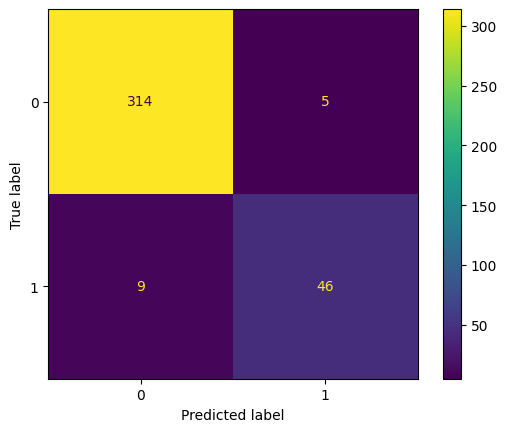

In [44]:
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test)

In [46]:
def evaluate(model):
    metrics = [balanced_accuracy_score, roc_auc_score, accuracy_score]
    predicts = model.predict(X_test)

    print('\t'.join([m.__name__ for m in metrics]))
    for scoring in metrics:
        print(f'{scoring(y_test, predicts):.3f}\t\t\t', end="")

evaluate(model)

balanced_accuracy_score	roc_auc_score	accuracy_score
0.910			0.910			0.963			

In [52]:
hyper_params = {
    'max_depth': [3,4,5],
    'learning_rate': [0.1, 1, 5],
    'gamma': [0, 0.5, 1],
    'reg_lambda': [1],
    'scale_pos_weight': [1, 3, 5, (y_train.shape[0]/sum(y_train)) - 1]
}

tuned_model = GridSearchCV(
    xgb.XGBClassifier(objective="binary:logistic",seed=13),param_grid=hyper_params, scoring='roc_auc',verbose=0,n_jobs=10,cv=5).fit(X_train, y_train)

In [54]:
print(tuned_model.best_params_)

{'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'reg_lambda': 1, 'scale_pos_weight': 3}


In [49]:
model = xgb.XGBClassifier(seed=13, gamma=0,learning_rate=0.1, max_depth=5, reg_lambda=1, scale_pos_weight=3)
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

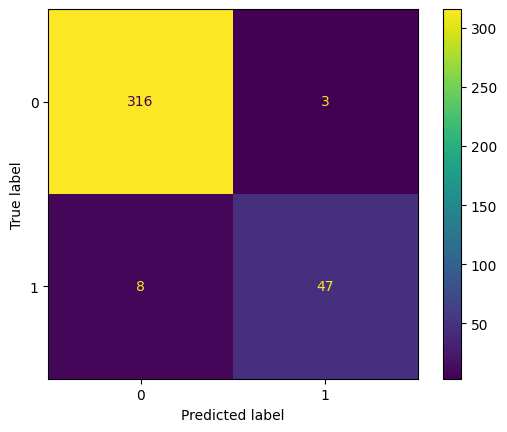

In [55]:
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test)

In [56]:
evaluate(model)

balanced_accuracy_score	roc_auc_score	accuracy_score
0.923			0.923			0.971			